# Start of the code

In [1]:
import sys
sys.path.append(r'/work/yzstat/yinglunz/UAV_images/')
import os
import json
import cv2
from tqdm import tqdm
import numpy as np
import glob
from numpy.random import seed
from numpy.random import randint
import joblib
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
import scipy.stats as st
#from model import Deeplabv3
from MobilenetV2_keras import Deeplabv3
from itertools import product

from matplotlib.colors import ListedColormap, BoundaryNorm
from helper_func import *



import random
path = r'/work/yzstat/yinglunz/Maize_images/'
result_path=r'/work/yzstat/yinglunz/Maize_images_RF/'
result_path2=r'/work/yzstat/yinglunz/Maize_images_MobilenetV2_random_weights/'
seed(42)

2022-04-01 12:56:50.536014: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-01 12:56:50.536057: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
def get_key(my_dict, val):
    for key, value in my_dict.items():
         if val == value:
             return key
 
    return "key doesn't exist"

In [6]:
colorsList = ['black', 'seagreen', ]

CustomCmap2 = ListedColormap(colorsList)
bounds=[0, 1, 2]
norm = BoundaryNorm(bounds, CustomCmap2.N)#, extend='min')

In [7]:
random.seed(42)

NIR_patch_list = sorted(glob.glob(path+ r'maize_NIR_patches/train/*.png'))
image_patch_list = sorted(glob.glob(path+ r'maize_image_patches/train/*.png'))
mask_patch_list = sorted(glob.glob(path+ r'maize_label_patches/train/*.png'))
pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_train_Patches_lr0.001_0.5_batch16_rs50_is42_300/*.png'))
image_patch_files=[os.path.basename(f) for f in image_patch_list]


test_NIR_patch_list = sorted(glob.glob(path+ r'maize_NIR_patches/test/*.png'))
test_image_patch_list = sorted(glob.glob(path+ r'maize_image_patches/test/*.png'))
test_mask_patch_list = sorted(glob.glob(path+ r'maize_label_patches/test/*.png'))
test_pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_test_Patches_lr0.001_0.5_batch16_rs50_is42_300/*.png'))
#test_pred_mask_patch_list

exclude_NIR_patch_list = sorted(glob.glob(path+ r'maize_exclude_NIR_patches/*.png'))
exclude_image_patch_list = sorted(glob.glob(path+ r'maize_exclude_image_patches/*.png'))
exclude_mask_patch_list = sorted(glob.glob(path+ r'maize_exclude_label_patches/*.png'))
exclude_pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_exclude_Patches_lr0.001_0.5_batch8_rs50_is42_300/*.png'))
#exclude_pred_mask_patch_list

In [8]:
num_classes=2
train_mask_patch_list=sorted(glob.glob(path+r'/maize_label_patches/train/*.png'))
train_image_patch_list=sorted(glob.glob(path+r'/maize_image_patches/train/*.png'))
#train_image_patch_list=sorted(glob.glob(path+r'\maize_image_patches\train\*.jpg')+glob.glob(path+r'\maize_image_patches\train\*.tif'))
test_mask_patch_list=sorted(glob.glob(path+r'/maize_label_patches/test/*.png'))
test_image_patch_list=sorted(glob.glob(path+r'/maize_image_patches/test/*.png'))
#test_image_patch_list=sorted(glob.glob(path+r'\maize_image_patches\test\*.jpg')+glob.glob(path+r'\maize_image_patches\test\*.tif'))
len(test_image_patch_list)

train_image_patch_files=[os.path.basename(f) for f in train_mask_patch_list]
train_mask_patch_files=[os.path.basename(f) for f in train_mask_patch_list]
len(test_image_patch_list)

test_image_patch_files=[os.path.basename(f) for f in test_mask_patch_list]
test_mask_patch_files=[os.path.basename(f) for f in test_mask_patch_list]


In [2]:
exclude_list=[
'103_Maize_Empty_Empty_20190628165307_20190628115307_20315-12857-9652-9000--9000.tif',

'105_Maize_Empty_Empty_20190703153927_20190703103927_29334-12848-9651-9000--8999.tif',

'106_Maize_Suat_C12_CLIT1_20190723163733_20190723113733_33844-12844-9651-8999--8999.tif',

'201_Maize_Suat_C1_CRF1_20190813195929_20190813145929_11298-19322-9651-9000--9000.tif',

'202_Maize_Suat_C2_CFIT4_20190807164953_20190807114953_15803-19330-9652-9000--8999.tif',

'205_Maize_Suat_C5_CRF3_20190717175421_20190717125421_29316-19354-9652-9000--8999.tif',

'206_Maize_Suat_C6_CFIT1_20190917180644_20190917130644_33820-19363-9651-9000--8999.tif',

'303_Maize_Empty_Empty_20190628164527_20190628114527_20298-25818-9652-9000--9000.tif',

'305_Maize_Frank_G3_DH_Full_20190819173156_20190819123156_29297-25859-9651-9000--8999.tif',

'306_Maize_Frank_G2_DH_Full_20190717175304_20190717125304_33796-25880-9652-9000--8999.tif',

'401_Maize_Frank_G1_DH_Full_20190904194409_20190904144409_11301-32235-9651-9000--8999.tif',

'402_Maize_Frank_G2_DH_Full_20190917180134_20190917130134_15795-32268-9651-9000--8999.tif',

'405_Maize_Frank_G3_DH_Full_20190910204615_20190910154615_29279-32367-9651-9000--9000.tif',

'501_Maize_Frank_G1_DH_Full_20190723161909_20190723111909_11302-38690-9651-8999--8999.tif',

'506_Maize_Frank_G2_DH_Full_20190828195655_20190828145655_33748-38917-9651-9000--8999.tif',

'506_Maize_Frank_G2_DH_Full_20190904172801_20190904122801_33748-38917-9651-9000--8999.tif',


'0308_Maize-Bai_DeKalbDKC6434-114Day-Hybrid-24k_NextMap_20200716183118_20200716133118_42903-25523-9651-9000--9000.tif',

'0508_Maize-Irmak_DKC63-90RIB_NextMap_20200716161624_20200716111624_42861-38482-9651-9000--9000.tif',


'201_Maize_Suat_C1_CRF1_20190807165031_20190807115031_11298-19322-9652-9000--8999.tif',

'201_Maize_Suat_C1_CRF1_20190819163454_20190819113454_11298-19322-9651-9000--8999.tif',

'202_Maize_Suat_C2_CFIT4_20190924164022_20190924114022_15803-19330-9652-9000--9000.tif',

'204_Maize_C4_CFIT2_20190717171915_20190717121915_24812-19346-9652-9000--8999.tif',

'205_Maize_Suat_C5_CRF3_20190917180721_20190917130721_29316-19354-9651-9000--8999.tif',

'304_Maize_Frank_G2_DL_Full_20190819165425_20190819115425_24797-25839-9651-9000--8999.tif',

'305_Maize_Empty_Empty_20190703153136_20190703103136_29297-25859-9651-9000--8999.tif',

'404_Maize_Frank_G3_DL_Full_20190910204652_20190910154652_24784-32334-9651-9000--9000.tif',


'501_Maize_G1_DH_Full_20190717170459_20190717120459_11302-38690-9651-9000--8999.tif',

'0306_Maize-Schnable_Mixed_NextMap_20200716183219_20200716133219_33953-25521-9651-9000--9000.tif',

'0308_Maize-Bai_DeKalbDKC6434-114Day-Hybrid-24k_NextMap_20200716203501_20200716153501_42903-25523-9651-9000--9000.tif',

'0312_Maize-Schachtman_Mixed_NextMap_20200702211644_20200702161644_60805-25526-9651-9000--9000.tif',

'0509_Maize-Irmak_DKC63-90RIB_NextMap_20200716202301_20200716152301_47333-38476-9651-9000--9000.tif',

'0909_Maize-Irmak_DKC63-90RIB_NextMap_20200803165435_20200803115435_47696-64132-9651-18000--9000.tif',
]

exclude_files=[f.split('.')[0] for f in exclude_list]




# RF (rgb) CV
## n_estimators=200, max_depth=30

In [10]:
train_val_size=750
score2000_dic, score3000_dic={}, {}
for k in [3][:]:
    for point_per_train_image in [2000, 3000]:
        file=sorted(glob.glob(result_path+'/multiclass/RF_iou_cm_'+str(k)+'nn_points_per_image_'+\
                             str(point_per_train_image)+'_rgb/*nestimators*.pkl'))
            
        for f in file:
            score=joblib.load(f) #all image patch iou of one model prediction
            if point_per_train_image==2000:

                           
                score2000_dic[os.path.basename(f)]=np.round(score,4)
            else: score3000_dic[os.path.basename(f)]=np.round(score,4)
            #iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
            #print('score: ', score)
            #print('\n')
            #random_iou.append(iou)




    #multiclass/RF_iou_cm_1nn_points_per_image_2000                            

In [13]:
score3000_dic

{'RF_3nn_nestimators100_maxdepth10_score.pkl': 0.7545,
 'RF_3nn_nestimators100_maxdepth20_score.pkl': 0.7702,
 'RF_3nn_nestimators100_maxdepth30_score.pkl': 0.7707,
 'RF_3nn_nestimators100_maxdepth40_score.pkl': 0.7704,
 'RF_3nn_nestimators100_maxdepth50_score.pkl': 0.7705,
 'RF_3nn_nestimators150_maxdepth10_score.pkl': 0.7546,
 'RF_3nn_nestimators150_maxdepth20_score.pkl': 0.7707,
 'RF_3nn_nestimators150_maxdepth30_score.pkl': 0.7718,
 'RF_3nn_nestimators150_maxdepth40_score.pkl': 0.7718,
 'RF_3nn_nestimators150_maxdepth50_score.pkl': 0.7719,
 'RF_3nn_nestimators200_maxdepth10_score.pkl': 0.7547,
 'RF_3nn_nestimators200_maxdepth20_score.pkl': 0.7711,
 'RF_3nn_nestimators200_maxdepth30_score.pkl': 0.7726,
 'RF_3nn_nestimators200_maxdepth40_score.pkl': 0.7725,
 'RF_3nn_nestimators200_maxdepth50_score.pkl': 0.7724,
 'RF_3nn_nestimators50_maxdepth10_score.pkl': 0.7542,
 'RF_3nn_nestimators50_maxdepth20_score.pkl': 0.7684,
 'RF_3nn_nestimators50_maxdepth30_score.pkl': 0.7673,
 'RF_3nn_nest

In [14]:
print(max(score3000_dic.values()))
get_key(score3000_dic, max(score3000_dic.values()))

0.7726


'RF_3nn_nestimators200_maxdepth30_score.pkl'

# RF(RGB+GLCM) CV
## n_esimators=200, max_depth=50

In [30]:
train_val_size=750
score2000_dic, score3000_dic={}, {}
for k in [1, 2, 3, 4][:]:
    for point_per_train_image in [2000, 3000]:
        file=sorted(glob.glob(result_path+'/multiclass/RF_iou_cm_'+str(k)+'nn_points_per_image_'+\
                             str(point_per_train_image)+'/*nestimators*.pkl'))
            
        for f in file:
            score=joblib.load(f) #all image patch iou of one model prediction
            if point_per_train_image==2000:

                           
                score2000_dic[os.path.basename(f)]=np.round(score,4)
            else: score3000_dic[os.path.basename(f)]=np.round(score,4)
            #iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
            #print('score: ', score)
            #print('\n')
            #random_iou.append(iou)




    #multiclass/RF_iou_cm_1nn_points_per_image_2000                            

In [42]:
print(max(score2000_dic.values()))
get_key(score2000_dic, max(score2000_dic.values()))

0.7718


'RF_3nn_nestimators200_maxdepth30_score.pkl'

In [48]:
score3000_dic

{'RF_1nn_nestimators100_maxdepth10_score.pkl': 0.7486,
 'RF_1nn_nestimators100_maxdepth20_score.pkl': 0.7569,
 'RF_1nn_nestimators100_maxdepth30_score.pkl': 0.7562,
 'RF_1nn_nestimators100_maxdepth40_score.pkl': 0.7559,
 'RF_1nn_nestimators100_maxdepth50_score.pkl': 0.7562,
 'RF_1nn_nestimators150_maxdepth10_score.pkl': 0.7486,
 'RF_1nn_nestimators150_maxdepth20_score.pkl': 0.7572,
 'RF_1nn_nestimators150_maxdepth30_score.pkl': 0.7572,
 'RF_1nn_nestimators150_maxdepth40_score.pkl': 0.757,
 'RF_1nn_nestimators150_maxdepth50_score.pkl': 0.7571,
 'RF_1nn_nestimators200_maxdepth10_score.pkl': 0.7486,
 'RF_1nn_nestimators200_maxdepth20_score.pkl': 0.7574,
 'RF_1nn_nestimators200_maxdepth30_score.pkl': 0.7576,
 'RF_1nn_nestimators200_maxdepth40_score.pkl': 0.7575,
 'RF_1nn_nestimators200_maxdepth50_score.pkl': 0.7575,
 'RF_1nn_nestimators50_maxdepth10_score.pkl': 0.7481,
 'RF_1nn_nestimators50_maxdepth20_score.pkl': 0.7557,
 'RF_1nn_nestimators50_maxdepth30_score.pkl': 0.7533,
 'RF_1nn_nesti

In [46]:
print(max(score3000_dic.values()))
get_key(score3000_dic, max(score3000_dic.values()))

0.7723


'RF_3nn_nestimators200_maxdepth50_score.pkl'

# IoU, prfasvc for RF(RGB+GLCM) and RF(RGB)

In [18]:
train_val_size=750
for k in [3]:
    for point_per_train_image in [3000]:
        file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                         str(point_per_train_image)+'/test_'+str(train_val_size)+'.pkl')
        #iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
        print('iou: ', np.round(iou, 4))
        #random_iou.append(iou)


        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
        print('mean iou: ', np.round(mean_iou, 4))
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))



    file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                             str(point_per_train_image)+'/test_prfasvc_'+str(train_val_size)+'.pkl')
            #iou=joblib.load(file) #all image patch iou of one model prediction

    iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
    print('p, r, f, a, s, mask vc, predict vc: ', np.round(iou, 4))

                       
                            

iou:  [0.5764 0.6751]
mean iou:  0.6258
p, r, f, a, s, mask vc, predict vc:  [0.7913 0.8453 0.7943 0.7785 0.7334 0.5555 0.593 ]


In [19]:
train_val_size=750
for k in [3]:
    for point_per_train_image in [3000]:
        file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                         str(point_per_train_image)+'_rgb/test_'+str(train_val_size)+'.pkl')
        #iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
        print('iou: ', np.round(iou, 4))
        #random_iou.append(iou)


        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
        print('mean iou: ', np.round(mean_iou, 4))
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))



    file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                             str(point_per_train_image)+'_rgb/test_prfasvc_'+str(train_val_size)+'.pkl')
            #iou=joblib.load(file) #all image patch iou of one model prediction

    iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
    print('p, r, f, a, s, mask vc, predict vc: ', np.round(iou, 4))

                       
                            

                       
                            

iou:  [0.5774 0.6764]
mean iou:  0.6269
p, r, f, a, s, mask vc, predict vc:  [0.7918 0.8468 0.7952 0.7794 0.7333 0.5555 0.5939]


In [9]:
train_val_size=750
for k in [1, 2, 3, 4]:
    for point_per_train_image in [2000]:
        file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                         str(point_per_train_image)+'/test_'+str(train_val_size)+'.pkl')
        #iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
        print('iou: ', iou)
        #random_iou.append(iou)


        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
        print('mean iou: ', mean_iou)
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))

                       
                            

iou:  [0.56119623 0.65732392]
mean iou:  0.6092600729578268
iou:  [0.57203152 0.67036697]
mean iou:  0.6211992423703494
iou:  [0.57585929 0.67645684]
mean iou:  0.6261580644703921
iou:  [0.57683548 0.67964166]
mean iou:  0.6282385684689322


In [16]:
train_val_size=750
for k in [1, 2, 3, 4]:
    for point_per_train_image in [2000]:
        file=joblib.load(result_path+'/multiclass/iou_pkl_'+str(k)+'nn_points_per_image_'+\
                         str(point_per_train_image)+'/test_prfa_'+str(train_val_size)+'.pkl')
        #iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
        print(iou)

                       

[0.78224271 0.82840656 0.78176319 0.76648787 0.55553171 0.58530049]
[0.78859068 0.84118094 0.79095044 0.77503684 0.55553171 0.59147337]
[0.79032794 0.8484373  0.79518307 0.77876263 0.55553171 0.59632673]
[0.79028661 0.85330558 0.79740963 0.78054591 0.55553171 0.60039064]


# RF visualization

seed to show the images:  0
k:  3
328
328
0913_Maize-Schachtman_Mixed_NextMap_20200803165243_20200803115243_65682-64081-9651-18000--9000_0_3.png
0913_Maize-Schachtman_Mixed_NextMap_20200803165243_20200803115243_65682-64081-9651-18000--9000_0_3.png
[0 1]
image index:  0
0913_Maize-Schachtman_Mixed_NextMap_20200825193253_20200825143253_65682-64081-9652-18000--9000_2_1.png
0913_Maize-Schachtman_Mixed_NextMap_20200825193253_20200825143253_65682-64081-9652-18000--9000_2_1.png
[0 1]
image index:  1
0105_Maize-Schnable_Mixed_NextMap_20200716163837_20200716113837_29511-12538-9651-9000--9000_2_1.png
0105_Maize-Schnable_Mixed_NextMap_20200716163837_20200716113837_29511-12538-9651-9000--9000_2_1.png
[0 1]
image index:  2
0212_Maize-Schachtman_Mixed_NextMap_20200629204229_20200629154229_60831-19060-9652-9000--9000_1_3.png
0212_Maize-Schachtman_Mixed_NextMap_20200629204229_20200629154229_60831-19060-9652-9000--9000_1_3.png
[0 1]
image index:  3
401_Maize_Frank_G1_DH_Full_20190904173154_201909041231

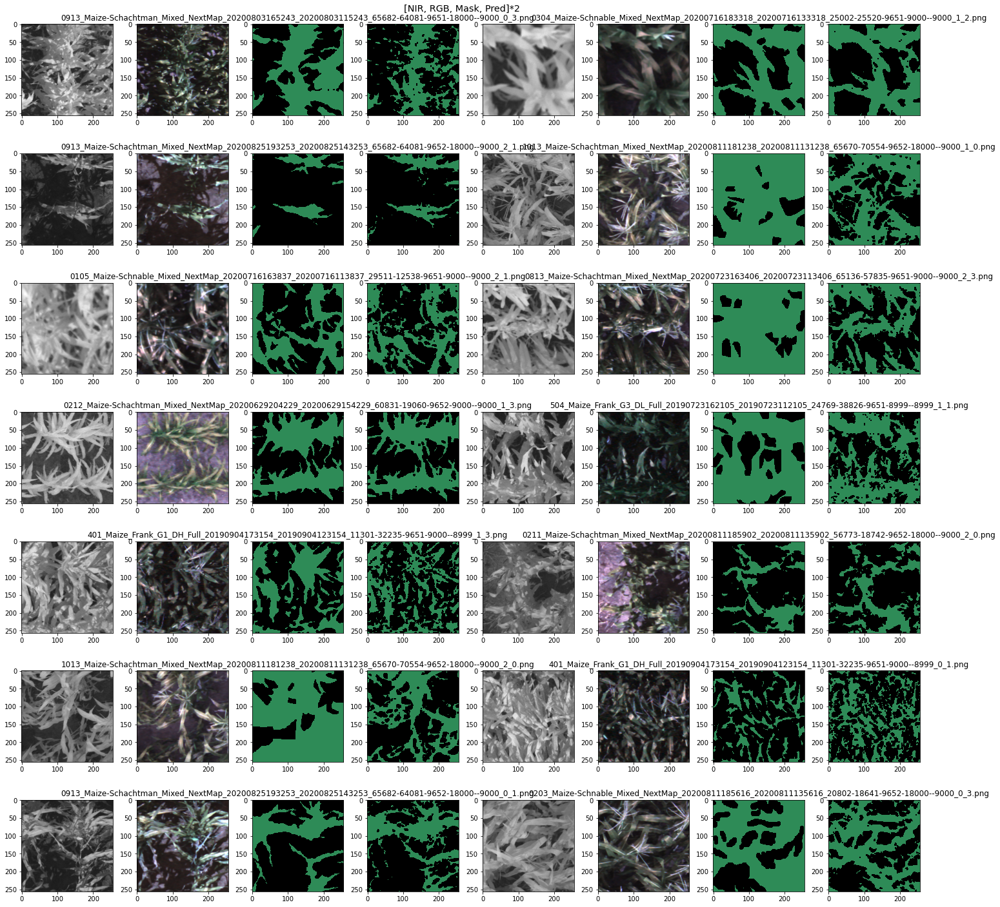

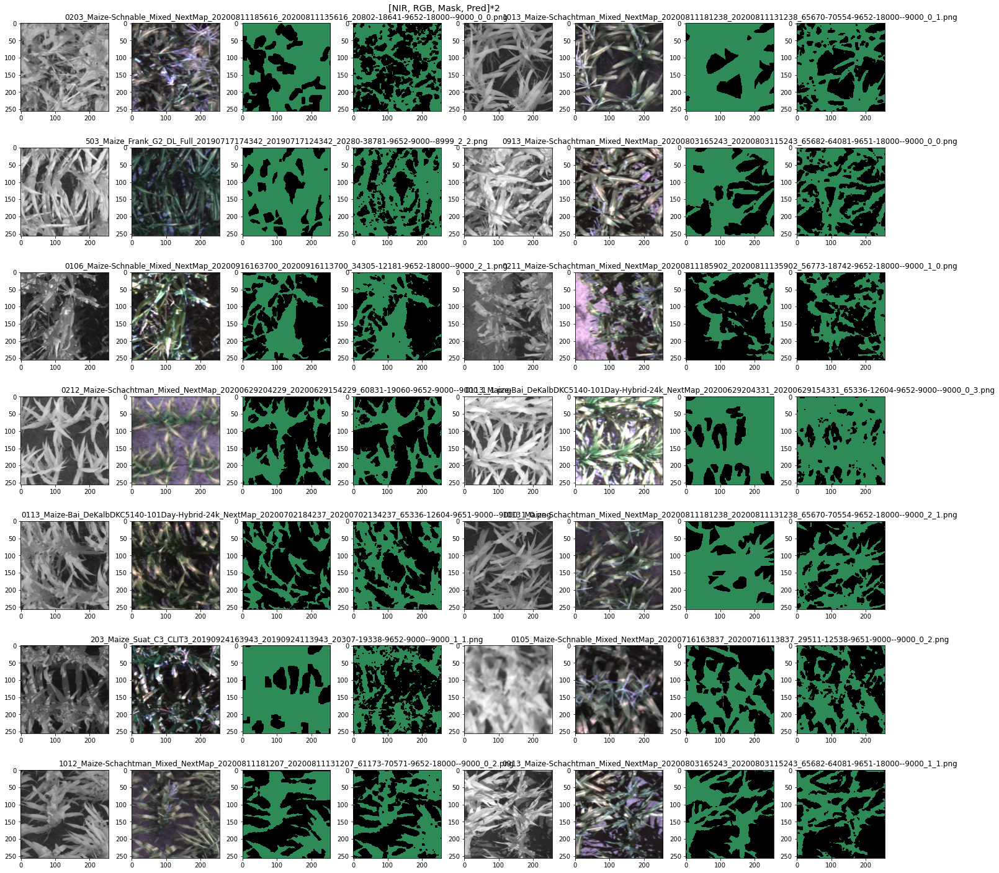

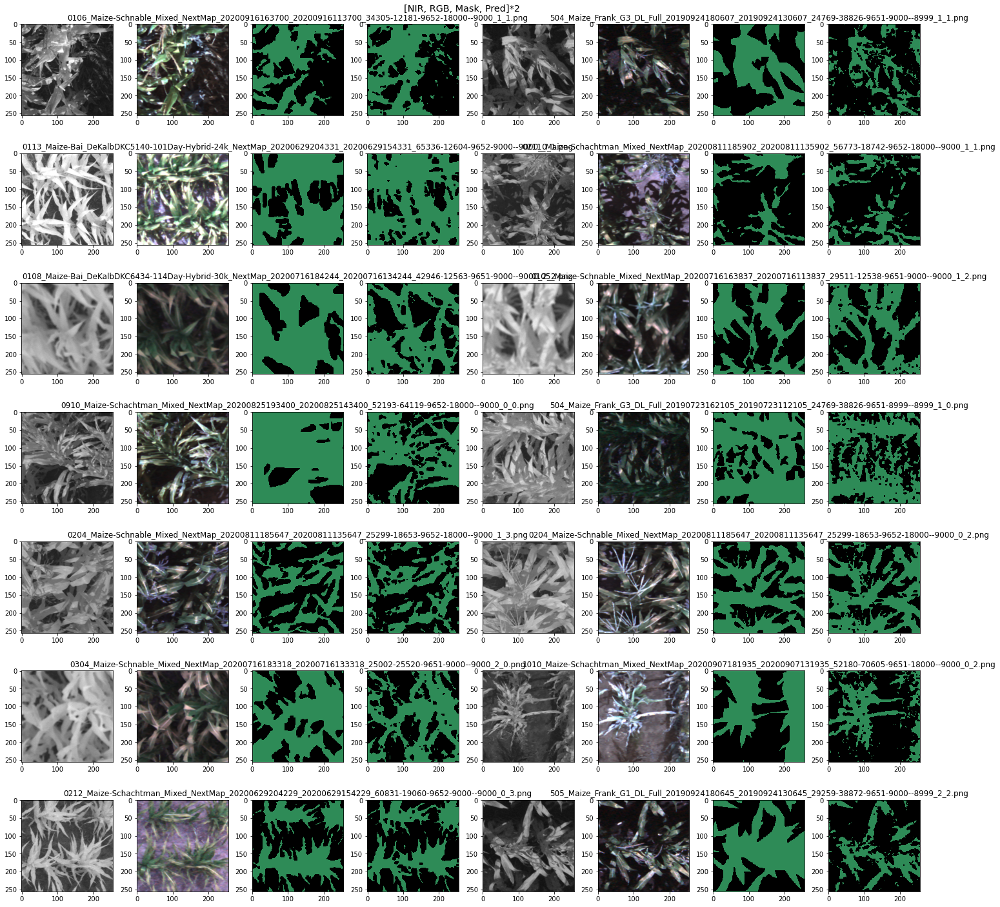

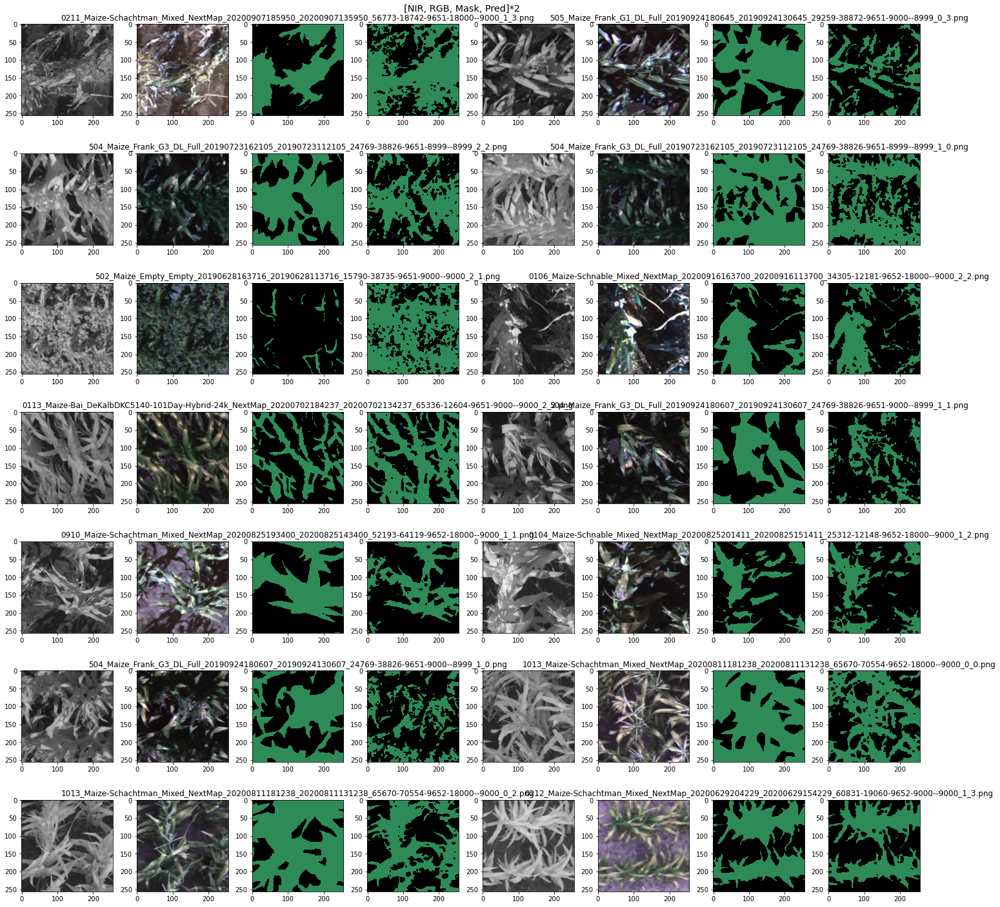

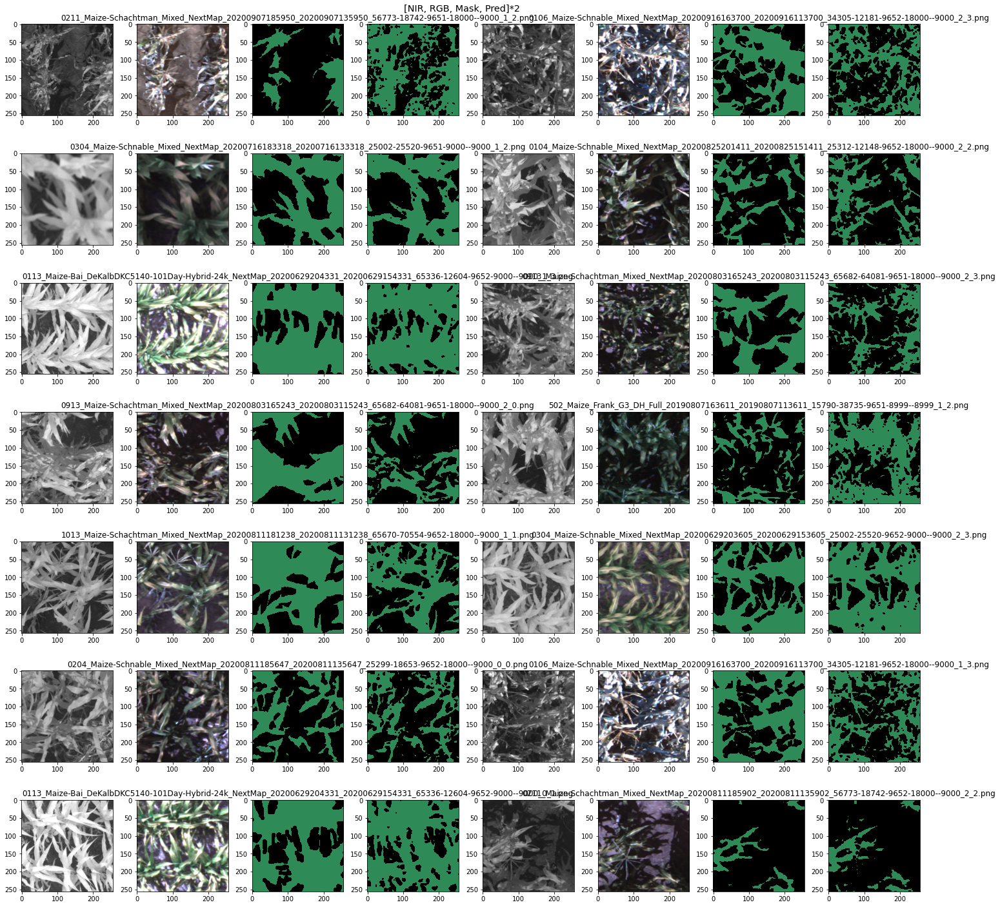

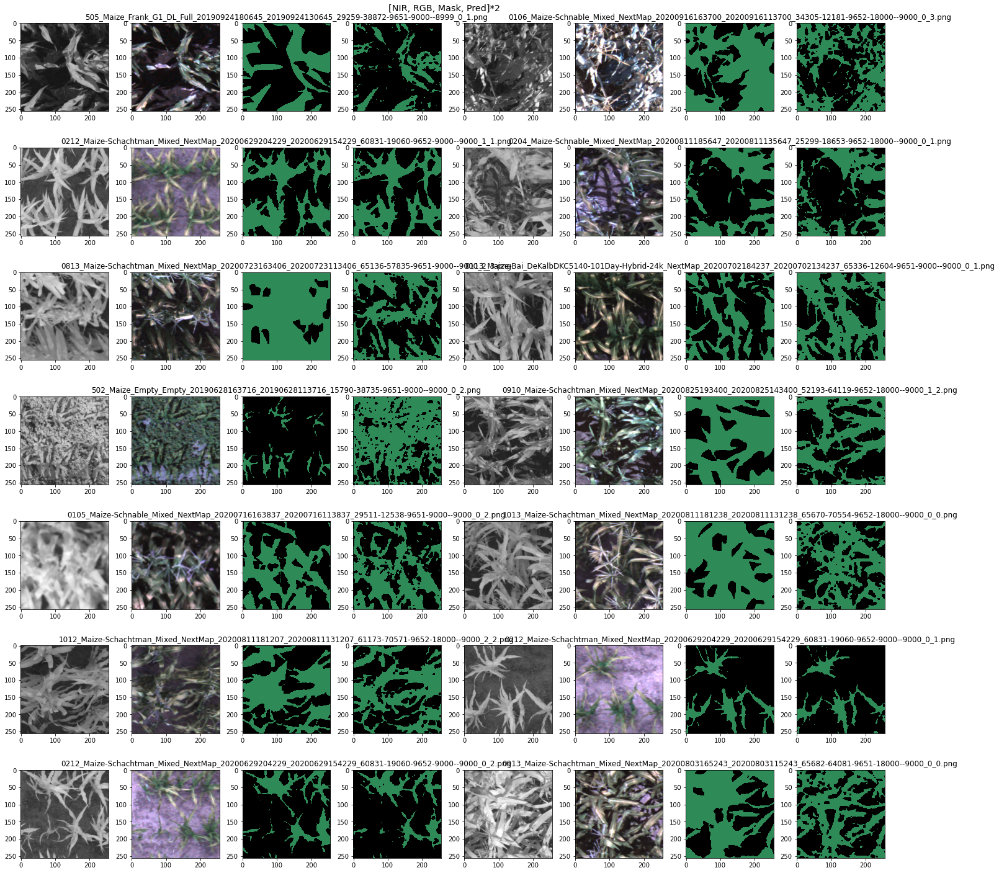

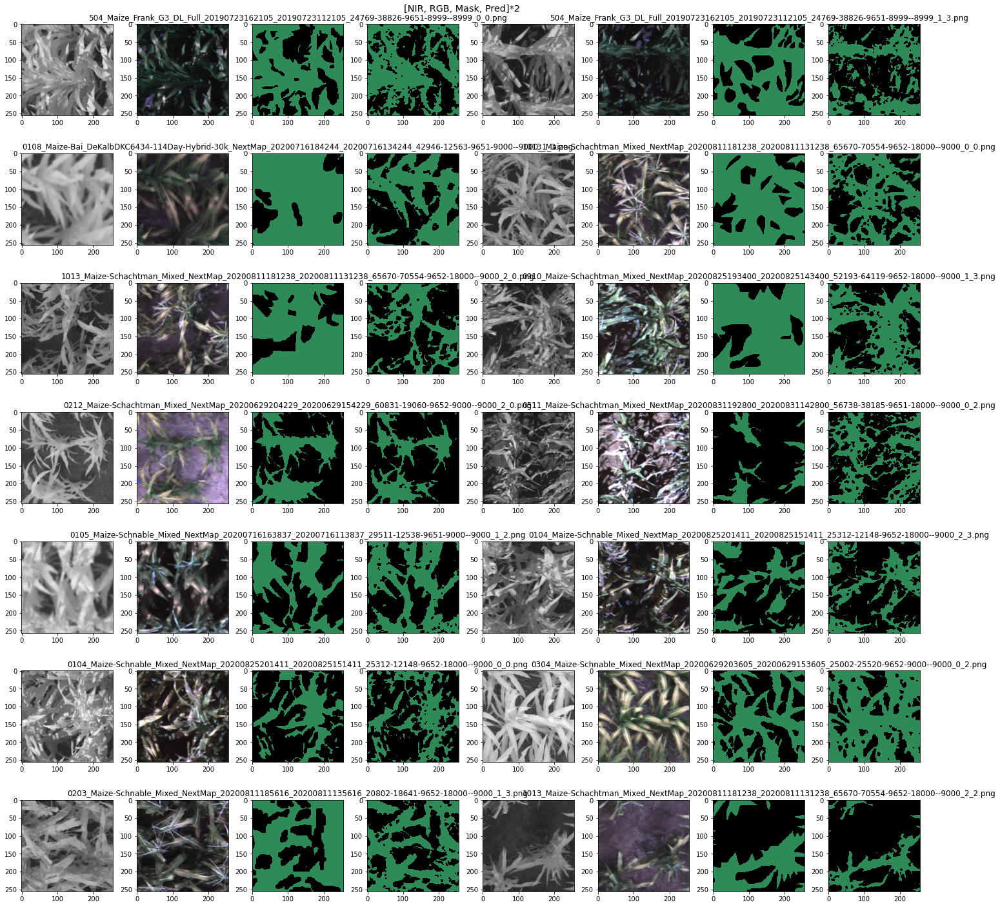

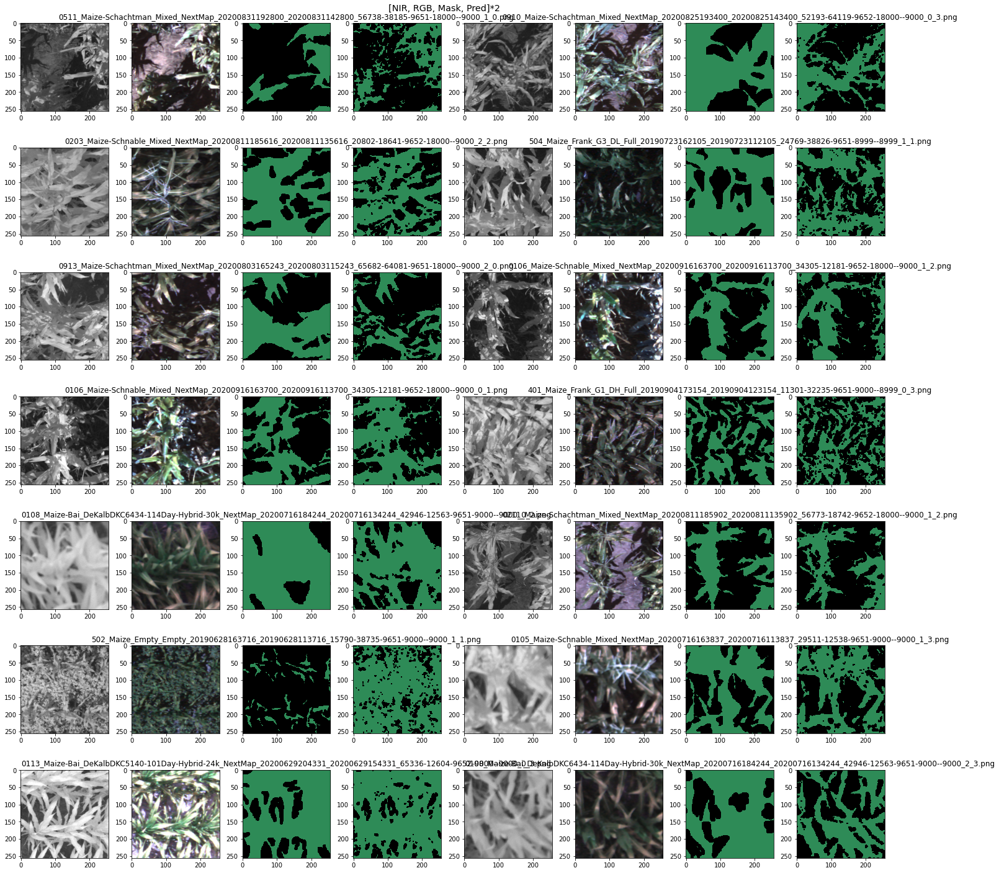

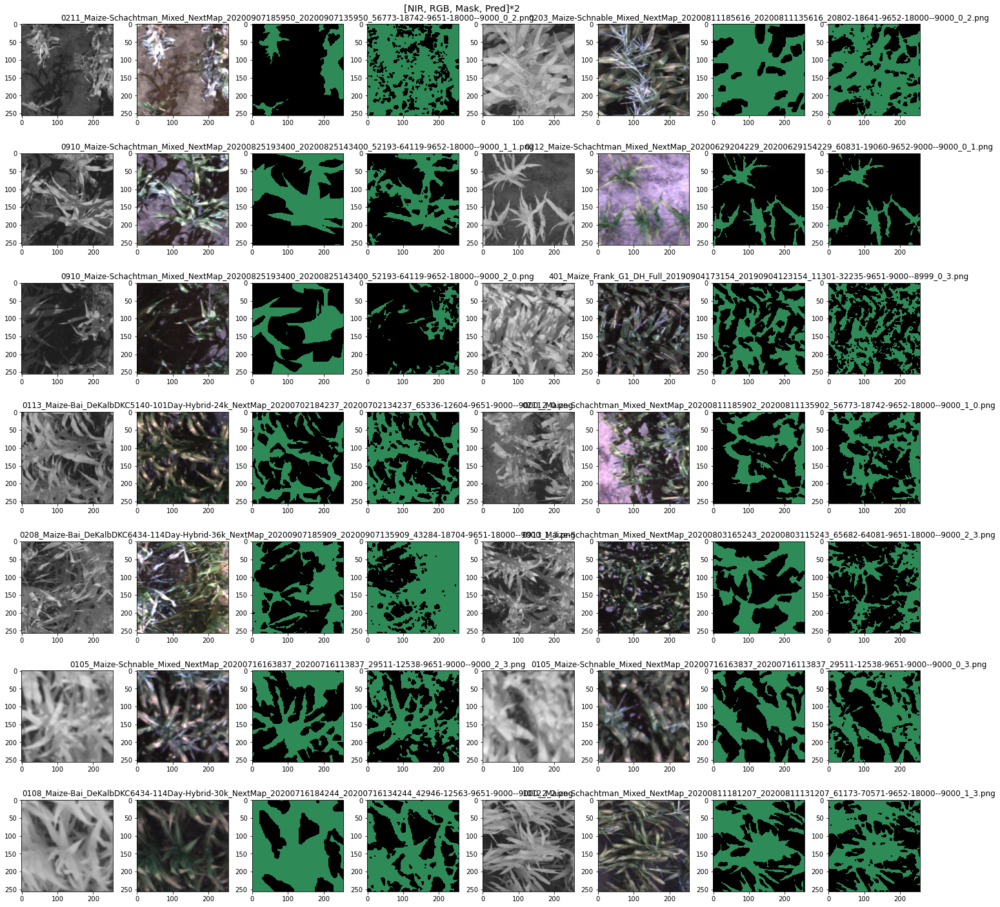

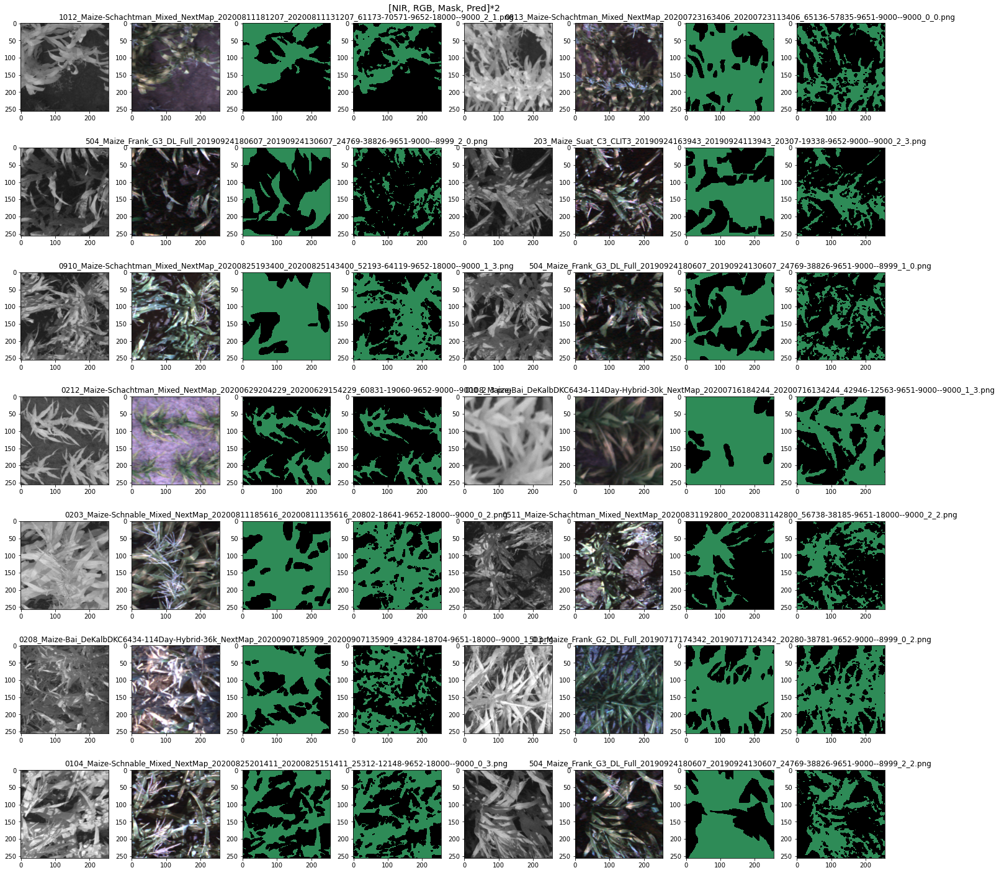

In [21]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col
image_seed=42
point_per_train_image=3000
for rs in range(10):
#for rs in np.concatenate(([42], range(10)))[:5]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    #for size in np.append(np.linspace(50, 300, 6), 824)[:]:
    for k in [1, 2, 3][-1:]:
        k=int(k)
        print('k: ', k)
        random.seed(rs)

        test_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                                     r'multiclass_prediction/'+str(k)+'nn_points_per_image_'+\
                                                   str(point_per_train_image)+'/RF_'+str(k)+'nn/*.png'))
        all_pred_mask_patch_list=test_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        sample_images=random.sample(all_image_patch_files, n_images_per_pdf)
        #sample_images=[all_image_patch_files[i] for i in \
         #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        

        fig.savefig(result_path+r'multiclass/visualization/test_vis_'+str(k)+'nn_points_per_image_'+\
                                                   str(point_per_train_image)+'_seed'+str(rs)+'.pdf',\
                    bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)
        

# RF RGB Visulization

In [ ]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col
image_seed=42
point_per_train_image=3000
for rs in range(10):
#for rs in np.concatenate(([42], range(10)))[:5]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    #for size in np.append(np.linspace(50, 300, 6), 824)[:]:
    for k in [1, 2, 3][-1:]:
        k=int(k)
        print('k: ', k)
        random.seed(rs)

        test_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                                     r'multiclass_prediction/'+str(k)+'nn_points_per_image_'+\
                                                   str(point_per_train_image)+'/RF_'+str(k)+'nn_rgb/*.png'))
        all_pred_mask_patch_list=test_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        sample_images=random.sample(all_image_patch_files, n_images_per_pdf)
        #sample_images=[all_image_patch_files[i] for i in \
         #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        

        fig.savefig(result_path+r'multiclass/visualization/test_vis_'+str(k)+'nn_points_per_image_'+\
                                                   str(point_per_train_image)+'_rgb_seed'+str(rs)+'.pdf',\
                    bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)
        

# Threshold


## 1. Evaluate HSV curve for image patches
### Conclusion: Hue channel alone is sufficient for threholding

505_Maize_Frank_G1_DL_Full_20190924180645_20190924130645_29259-38872-9651-9000--8999_2_3.png
image index:  0


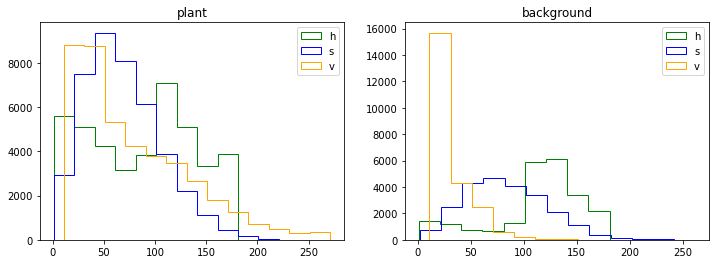

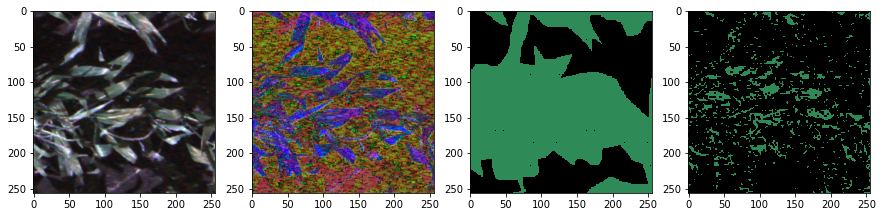

0113_Maize-Bai_DeKalbDKC5140-101Day-Hybrid-24k_NextMap_20200702184237_20200702134237_65336-12604-9651-9000--9000_0_1.png
image index:  1


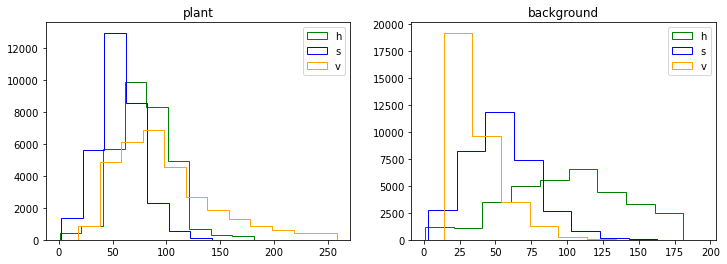

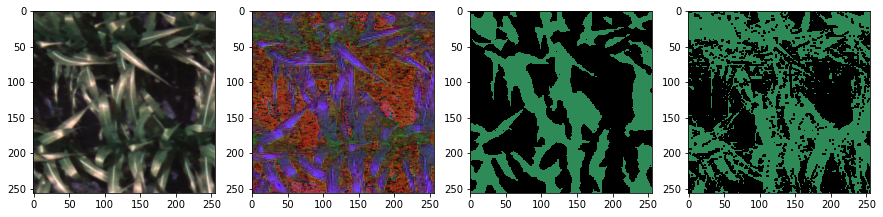

0105_Maize-Schnable_Mixed_NextMap_20200716163837_20200716113837_29511-12538-9651-9000--9000_0_0.png
image index:  2


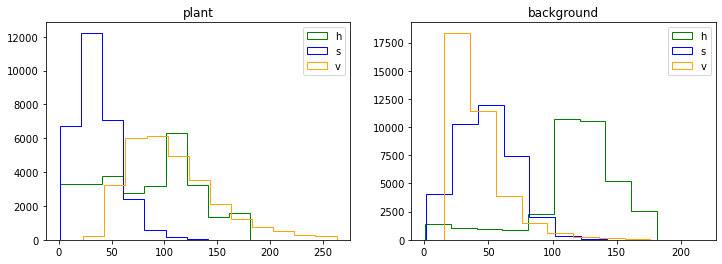

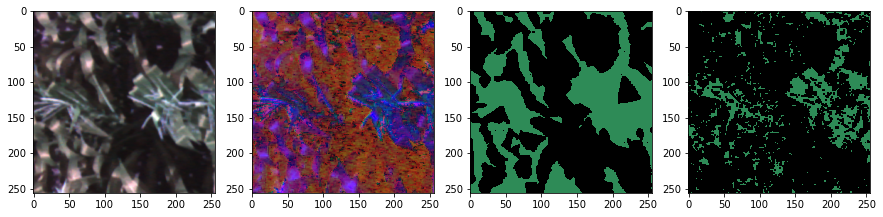

0304_Maize-Schnable_Mixed_NextMap_20200629203605_20200629153605_25002-25520-9652-9000--9000_0_3.png
image index:  3


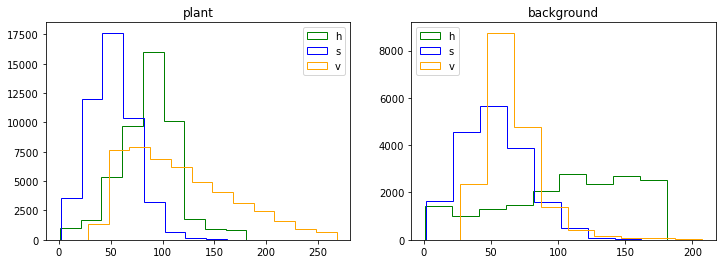

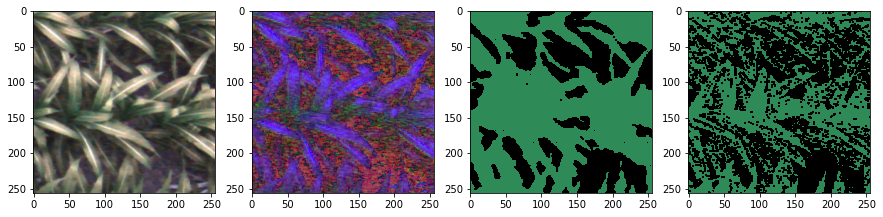

0212_Maize-Schachtman_Mixed_NextMap_20200629204229_20200629154229_60831-19060-9652-9000--9000_0_0.png
image index:  4


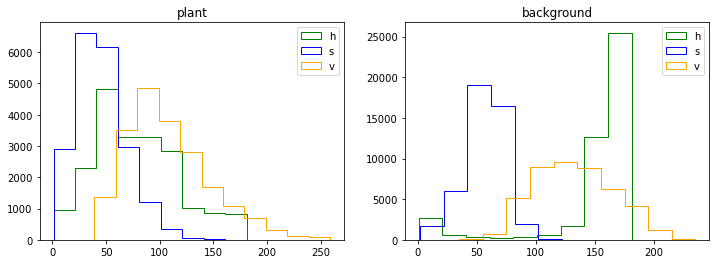

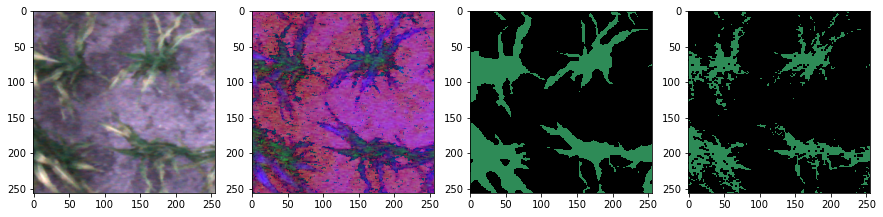

0211_Maize-Schachtman_Mixed_NextMap_20200811185902_20200811135902_56773-18742-9652-18000--9000_2_3.png
image index:  5


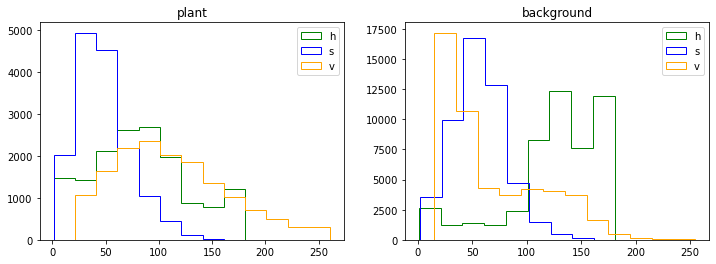

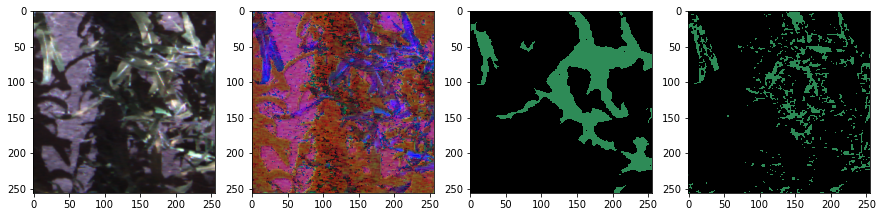

0203_Maize-Schnable_Mixed_NextMap_20200811185616_20200811135616_20802-18641-9652-18000--9000_0_3.png
image index:  6


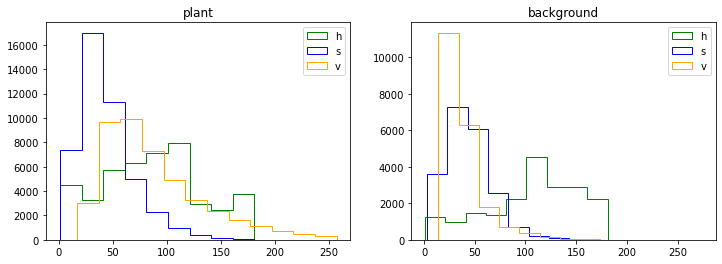

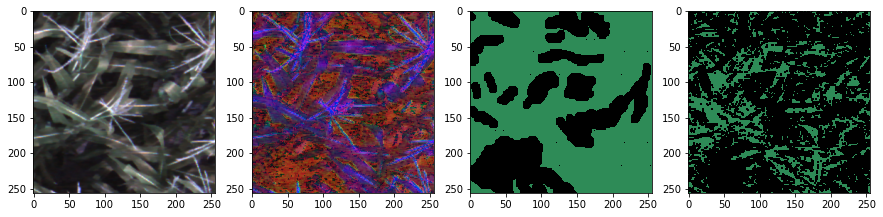

0113_Maize-Bai_DeKalbDKC5140-101Day-Hybrid-24k_NextMap_20200629204331_20200629154331_65336-12604-9652-9000--9000_1_3.png
image index:  7


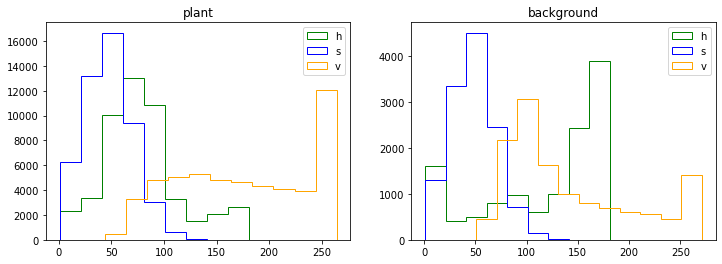

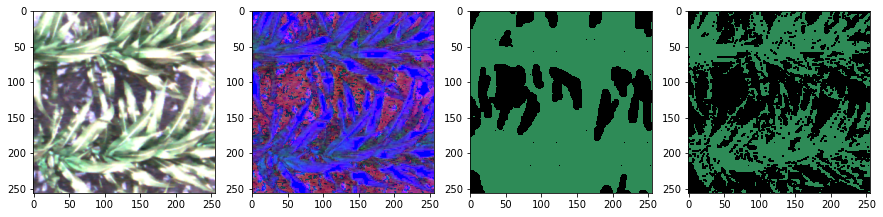

502_Maize_Empty_Empty_20190628163716_20190628113716_15790-38735-9651-9000--9000_2_2.png
image index:  8


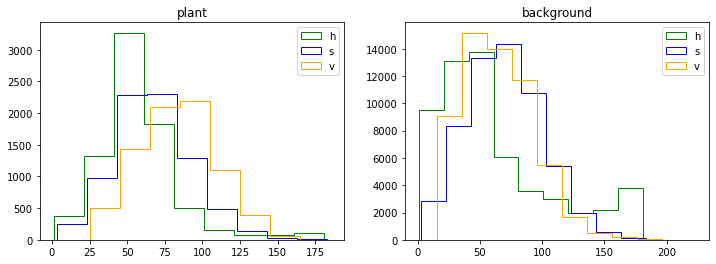

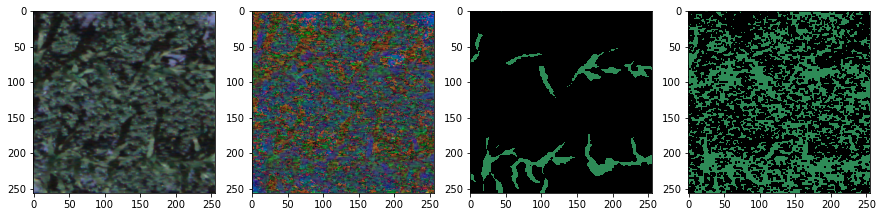

0108_Maize-Bai_DeKalbDKC6434-114Day-Hybrid-30k_NextMap_20200716184244_20200716134244_42946-12563-9651-9000--9000_2_3.png
image index:  9


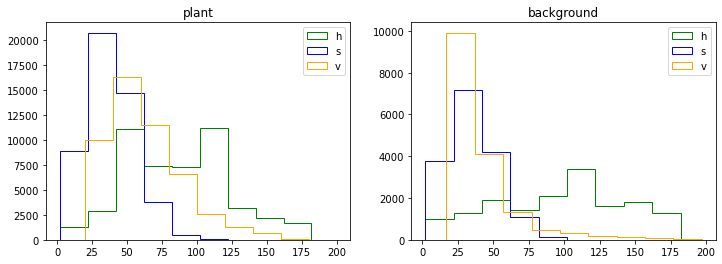

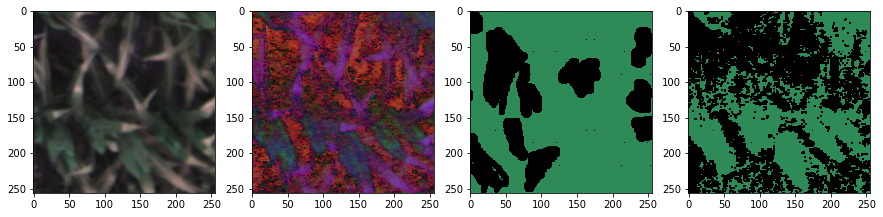

In [63]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]
random.seed(42) 
    
    #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
sample_images=random.sample(all_image_patch_files, 10)
for i, file in enumerate(sample_images):
    #print(all_image_patch_files.index(file))
    mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


    #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)
    #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

    #print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
    print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
    #print(np.unique(pred_mask))
    img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower = (10,0,0)
    upper = (110,255,255)
    # Threshold the HSV image
    pred_mask =cv2.inRange(hsv_img, lower, upper)//255
    binwidth=20
    fig, axes = plt.subplots(1, 2, figsize = (12,4))
    result = cv2.bitwise_and(hsv_img, hsv_img, mask=mask)
    background_mask=((-1)*mask+1).astype('uint8')
    background_result = cv2.bitwise_and(hsv_img, hsv_img, mask=background_mask)
    
    x = [i for i in result[:, :, 0].flatten() if i != 0]
    axes[0].hist(x, color='green', histtype='step', stacked=True, fill=False, \
             bins=range(min(x), max(x) + binwidth, binwidth), label='h')
    
    x = [i for i in result[:, :, 1].flatten() if i != 0]
    axes[0].hist(x, color='blue', histtype='step', stacked=True, fill=False,\
                         bins=range(min(x), max(x) + binwidth, binwidth), label='s')
    
    x = [i for i in result[:, :, 2].flatten() if i != 0]
    axes[0].hist(x, color='orange', histtype='step', stacked=True, fill=False, \
                         bins=range(min(x), max(x) + binwidth, binwidth), label='v')
    axes[0].legend(prop={'size': 10})
    axes[0].set_title('plant')

    background_result = cv2.bitwise_and(hsv_img, hsv_img, mask=1*(mask-1))
    x = [i for i in background_result[:, :, 0].flatten() if i != 0]

    axes[1].hist(x, color='green', histtype='step', stacked=True, fill=False, \
             bins=range(min(x), max(x) + binwidth, binwidth), label='h')
    
    x = [i for i in background_result[:, :, 1].flatten() if i != 0]
    axes[1].hist(x, color='blue', histtype='step', stacked=True, fill=False,\
                         bins=range(min(x), max(x) + binwidth, binwidth), label='s')
    
    x = [i for i in background_result[:, :, 2].flatten() if i != 0]
    axes[1].hist(x, color='orange', histtype='step', stacked=True, fill=False, \
                         bins=range(min(x), max(x) + binwidth, binwidth), label='v')
    
    axes[1].legend(prop={'size': 10})
    axes[1].set_title('background')
    
    print('image index: ', i)
    plt.figure(figsize=(15, 12))
    plt.subplot(1,4,1)
    plt.imshow(img)
    plt.subplot(1,4,2)
    plt.imshow(hsv_img)
    plt.subplot(1,4,3)
    plt.imshow(mask, cmap=CustomCmap2, norm=norm)
    plt.subplot(1,4,4)
    plt.imshow(pred_mask, cmap=CustomCmap2, norm=norm)  
    plt.show()

# Search for the threshold values

### conclusion: [10, 110] is the best (lowest sse)

In [60]:
all_NIR_patch_list= NIR_patch_list
all_image_patch_list= image_patch_list
all_mask_patch_list=mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]
print(len(all_NIR_patch_list)==len(all_image_patch_list))
print(len(all_NIR_patch_list)==len(all_mask_patch_list))
print('length of image patch list: ', len(all_NIR_patch_list))
random.seed(42) 

#sse_list={}
for bounds in list(product([10],  [110])): 
    sse_list[bounds]=[]
    print(bounds)
    lb, ub=bounds[0], bounds[1]
    #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
    #sample_images=random.sample(all_image_patch_files, 1)
    for i, file in enumerate(all_image_patch_files):
        if i%200==0:
            print(i)
        #print(all_image_patch_files.index(file))
        mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


        #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)
        #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

        #print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
        #print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
        #print(np.unique(pred_mask))
        img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])
        hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        lower = (lb,0,0)
        upper = (ub,255,255)
        # Threshold the HSV image
        pred_mask =cv2.inRange(hsv_img, lower, upper)//255


        sse_list[bounds].append(np.sum((mask.astype(int)-pred_mask.astype(int))**2))
    print('length of sse list: ', len(sse_list[bounds]))

True
True
length of image patch list:  750
(10, 110)
0
200
400
600
length of sse list:  750


In [61]:
tsse={}
for i in sse_list: 
    tsse[i]=np.sum(sse_list[i])
min(tsse.values())


14732076

In [62]:
tsse

{(0, 120): 15410600,
 (0, 140): 16888940,
 (0, 160): 19107731,
 (20, 120): 15643942,
 (20, 140): 17122282,
 (20, 160): 19341073,
 (40, 120): 17126353,
 (40, 140): 18604693,
 (40, 160): 20823484,
 (0, 180): 21708158,
 (20, 180): 21941500,
 (40, 180): 23423911,
 (0, 80): 18330385,
 (0, 100): 15557510,
 (20, 80): 18563727,
 (20, 100): 15790852,
 (40, 80): 20046138,
 (40, 100): 17273263,
 (0, 110): 14830398,
 (0, 130): 16027833,
 (20, 110): 15063740,
 (20, 130): 16261175,
 (10, 110): 14732076}

In [31]:
sse_list={}
sse_list[1]=[]
sse_list[1].append(np.sum((mask.astype(int)-pred_mask.astype(int))**2))
sse_list

{1: [36473]}

# write the threshold prediction to files

In [11]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]
print(len(all_NIR_patch_list)==len(all_image_patch_list))
print(len(all_NIR_patch_list)==len(all_mask_patch_list))
print('length of image patch list: ', len(all_NIR_patch_list))
random.seed(42) 
lb, ub=10, 110
pred_dir=result_path+'/multiclass_prediction/threshold_lb'+str(lb)+\
                                                   '_ub'+str(ub)
#sse_list={}
for bounds in list(product([lb],  [ub])): 
    #sse_list[bounds]=[]
    print(bounds)
    lb, ub=bounds[0], bounds[1]
    #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
    #sample_images=random.sample(all_image_patch_files, 1)
    for i, file in enumerate(all_image_patch_files):
        if i%200==0:
            print(i)
        #print(all_image_patch_files.index(file))
        mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


        #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)
        #pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)
        filename=os.path.basename(file)
        #print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
        #print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
        #print(np.unique(pred_mask))
        img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])
        hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        lower = (lb,0,0)
        upper = (ub,255,255)
        # Threshold the HSV image
        pred_mask =cv2.inRange(hsv_img, lower, upper)//255
        tf.keras.preprocessing.image.save_img(os.path.join(pred_dir, filename), \
                                              pred_mask[..., tf.newaxis], \
                                      data_format=None, file_format='png', scale=False)



True
True
length of image patch list:  328
(10, 110)
0
200


# Threshold IoU and Prfas

In [15]:
train_val_size=750

file=joblib.load(result_path+'/multiclass/iou_pkl_threshold_lb10_ub110/test_'+str(train_val_size)+'.pkl')
#iou=joblib.load(file) #all image patch iou of one model prediction

iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
print('iou: ', np.round(iou, 4))
#random_iou.append(iou)


#std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
#std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
#print(iou)
mean_iou=np.nanmean(iou) #mean iou: miou
print('mean iou: ', np.round(mean_iou, 4))
#std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
#std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))


file=joblib.load(result_path+'/multiclass/iou_pkl_threshold_lb10_ub110/test_prfasvc_'+str(train_val_size)+'.pkl')
        #iou=joblib.load(file) #all image patch iou of one model prediction
   
iou=np.nanmean(file, axis=0) #dim:2, Iou0, iou for that one model prediction
print('p, r, f, a, s, mask vc, predict vc: ', np.round(iou, 4))


                       
                            

iou:  [0.4589 0.5391]
mean iou:  0.499
p, r, f, a, s, mask vc, predict vc:  [0.7162 0.7049 0.6871 0.6788 0.6593 0.5555 0.5425]


# Threshold Visulization

In [ ]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col
image_seed=42

lb,ub=10, 110

for rs in range(10):
#for rs in np.concatenate(([42], range(10)))[:5]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    #for size in np.append(np.linspace(50, 300, 6), 824)[:]:
    for k in [1, 2, 3, 4][-1:]:
          
   
        random.seed(rs)

        test_pred_mask_patch_list=sorted(glob.glob(result_path+\
                                                   '/multiclass_prediction/threshold_lb'+str(lb)+\
                                                   '_ub'+str(ub)+'/*.png'))
        all_pred_mask_patch_list=test_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        sample_images=random.sample(all_image_patch_files, n_images_per_pdf)
        #sample_images=[all_image_patch_files[i] for i in \
         #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        

        fig.savefig(result_path+r'multiclass/visualization/test_vis_thres_lb'+str(lb)+\
                    '_ub'+str(ub)+'_seed'+str(rs)+'.pdf', bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)
        